# Setup

In [1]:
# importing main libs
import numpy as np
import pandas as pd

# libs for plots
import matplotlib.pyplot as plt
import seaborn as sns

# utils
from tqdm.notebook import tqdm

# # models (import)
# from GAR.grid import gen_scenario_data, growth_horizons, qRegFit
# from GAR.grid import cond_quant_fits, select_x_list, gen_PDF_and_CDF, gen_scenario_horizons

# # params
# sns.set(style='whitegrid')
# sns.set(rc={'figure.figsize':(4,4)})

In [102]:
# renaming columns
ifs_names = {
    'Country Name':'country',
    'Country Code': 'country code',
    'Time Period':'date',
    'Assets, Direct Investment, Debt Instruments, US Dollars (IADD_BP6_USD)':'Direct_Debt_Investment_assets',
    'Assets, Portfolio Investment, Debt Securities, US Dollars (IAPD_BP6_USD)': 'Portfolio_Debt_Sec_Investment_assets',
    'Exchange Rates, Real Effective Exchange Rate based on Consumer Price Index, Index (EREER_IX)':'REER',
    'Financial, Interest Rates, Monetary Policy-Related Interest Rate, Percent per annum (FPOLM_PA)':'MPR_FPOLMPA',
    'Gross Domestic Product, Nominal, Seasonally Adjusted, Domestic Currency (NGDP_SA_XDC)':'GDP_nominal_seas_adj',
    'Gross Domestic Product, Nominal, Unadjusted, Domestic Currency (NGDP_NSA_XDC)':'GDP_nominal',
    'Gross Domestic Product, Real, Seasonally Adjusted, Domestic Currency (NGDP_R_SA_XDC)':'GDP_real_seas_adj',
    'Gross Domestic Product, Real, Unadjusted, Domestic Currency (NGDP_R_NSA_XDC)':'GDP_real',
    'Liabilities, Direct Investment, US Dollars (ILD_BP6_USD)':'Direct_Investment_liab',
    'Liabilities, Portfolio Investment, Debt Securities, US Dollars (ILPD_BP6_USD)': 'Portfolio_Debt_Sec_Investment_liab',
    'Exchange Rates, National Currency Per U.S. Dollar, End of Period, Rate': 'FX',
    'Monetary and Financial Accounts, Interest Rates, Central Bank Policy Rates, Discount Rate, Percent per Annum': 'Policy_discount_rate',
    'Monetary and Financial Accounts, Interest Rates, Securities Markets, Government Debt Securities, Government Bond Yields, Short to Medium Term , Percent per Annum':'Yield_MT',
    'Monetary and Financial Accounts, Interest Rates, Securities Markets, Government Debt Securities, Treasury Bills, 3 Months, Percent per Annum':'Yield_ST',
    'Monetary and Financial Accounts, Interest Rates, Central Bank Policy Rates, Monetary Policy-Related Interest Rate, Percent per Annum':'MPR',
    'Gross Domestic Product, Deflator, Seasonally Adjusted, Index': 'GDP_deflator',
    'Labor Markets, Unemployment Rate, Percent': 'Unemployment'
}

fsi_names = {
    'Country Name':'country',
    'Country Code': 'country code',
    'Time Period':'date',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Asset Quality, Non-performing Loans to Total Gross Loans, Percent (FSANL_PT)':'NPL/TL',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Capital Adequacy, Non-performing Loans Net of Provisions to Capital, Percent (FSKNL_PT)':'NPL_of_provisions/Capital',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Capital Adequacy, Regulatory Capital to Risk-Weighted Assets, Percent (FSKRC_PT)':'CAR',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Capital Adequacy, Regulatory Tier 1 Capital to Risk-Weighted Assets, Percent (FSKRTC_PT)':'CAR_T1',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Earnings and Profitability, Interest Margin to Gross Income, Percent (FSEIM_PT)':'Interest_margin/Income',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Earnings and Profitability, Non-interest Expenses to Gross Income, Percent (FSENE_PT)':'Non-interest_expenses/Income',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Earnings and Profitability, Return on Assets, Percent (FSERA_PT)':'ROA',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Earnings and Profitability, Return on Equity, Percent (FSERE_PT)':'ROE',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Liquidity, Liquid Assets to Short Term Liabilities, Percent (FSLS_PT)':'Current_ratio',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Liquidity, Liquid Assets to Total Assets (Liquid Asset Ratio), Percent (FSLT_PT)':'Liquid_asset_ratio',
    'Financial Soundness Indicators, Core Set, Deposit Takers, Sensitivity to Market Risk, Net Open Position in Foreign Exchange to Capital, Percent (FSSNO_PT)':'Net_FX_position/Capital',
    'Monetary and Financial Accounts, Financial Soundness Indicators, Core Set, Deposit Takers, Asset Quality, Provisions to Non-performing Loans, Percent (FSPN_PT)':'Provisions/NPL',
    'Monetary and Financial Accounts, Financial Soundness Indicators, Core Set, Deposit Takers, Capital Adequacy, Tier 1 Capital to Assets, Percent (FSKA_PT)':'Capital_T1/Assets',
    'Total gross loans':'Loans',
    'Interest margin to gross income': 'Interest_margin/Income',
    'Total debt': 'Debt',
    'Gross domestic product': 'GDP_nominal',
    '50. Residential real estate loans': 'Res_real_estate_loans',
    '51. Commercial real estate loans': 'Com_real_estate_loans',
    '57. Credit to the private sector': 'Credit_to_private_sector',
    '59. Reference lending rates': 'Lending_rate',
    '60. Reference deposit rates': 'Deposit_rate',
    '61. Highest interbank rate': 'Interbank_rate_max',
    '62. Lowest interbank rate': 'Interbank_rate_min',
    '1. Residential real estate prices': 'Res_real_estate_price',
    '2. Commercial real estate prices': 'Com_real_estate_loans'
}

mapp_names = {
    'Country':'country',
    'ifscode':'country code'
}

other_country_codes = {463:'Syrian Arab Rep.', 925:'Turkmenistan', 
                       466:'United Arab Emirates'}

# Loading data

In [3]:
# Datasets
# 1) Integrated Macroprudential Policy
mapp = pd.read_excel('../data/panel_data/iMaPP/iMaPP_database.xlsx', sheet_name='MaPP')
mapp['date'] = pd.to_datetime(mapp['Year'].astype(str) + '-' + mapp['Month'].astype(str), format='%Y-%m')
mapp.set_index('date', inplace=True)
mapp.rename(columns=mapp_names, inplace=True)
mapp_codes = dict(zip(mapp['country code'], mapp['country']))
mapp.drop(columns=['country', 'iso3', 'iso2', 'AE', 'EMDE', 'Year', 'Month'], inplace=True)
mapp.index = mapp.index.to_period('Q')
mapp = mapp.groupby(['date', 'country code']).sum().reset_index('country code')

In [4]:
# 2) Financial soundness indicators
fsi = pd.read_csv('../data/panel_data/FSI.csv')
fsi = fsi[fsi.columns[fsi.isna().sum() < int(fsi.shape[0]*0.8)]].copy()
fsi.rename(columns=fsi_names, inplace=True)
wd = pd.to_datetime(fsi['date'], format='%YQ%m')
fsi['date'] = pd.PeriodIndex(year=wd.dt.year, quarter=wd.dt.month)
fsi_codes = dict(zip(fsi['country code'], fsi['country']))
fsi.drop(columns=['country'], inplace=True)

# adding back all the missing values
fsi_pindex = pd.period_range(fsi['date'].min(), fsi['date'].max())
fsi_full_index = pd.MultiIndex.from_product([fsi_pindex, fsi['country code'].unique()],
                                            names=['date', 'country code'])
fsi.set_index(['date', 'country code'], inplace=True)
fsi = fsi.reindex(fsi_full_index).reset_index()
fsi = fsi.sort_values(['country code', 'date']).reset_index(drop=True)

In [5]:
# 3) International financial statistics
ifs = pd.read_csv('../data/panel_data/IFS.csv')
ifs = ifs[ifs.columns[ifs.isna().sum() < int(ifs.shape[0]*0.8)]].copy()
ifs.rename(columns=ifs_names, inplace=True)
wd = pd.to_datetime(ifs['date'], format='%YQ%m')
ifs['date'] = pd.PeriodIndex(year=wd.dt.year, quarter=wd.dt.month)
ifs_codes = dict(zip(ifs['country code'], ifs['country']))
ifs.drop(columns=['country'], inplace=True)

# # adding back all the missing values
ifs_pindex = pd.period_range(ifs['date'].min(), ifs['date'].max())
ifs_full_index = pd.MultiIndex.from_product([ifs_pindex, ifs['country code'].unique()],
                                            names=['date', 'country code'])
ifs.set_index(['date', 'country code'], inplace=True)
ifs = ifs.reindex(ifs_full_index).reset_index()
ifs = ifs.sort_values(['country code', 'date']).reset_index(drop=True)

In [50]:
# 4) FSI 2
fsi_2 = pd.read_csv('../data/panel_data/FSI2.csv')
fsi_2.rename(columns=fsi_names, inplace=True)
wd = pd.to_datetime(fsi_2['date'], format='Q%m %Y')
fsi_2['date'] = pd.PeriodIndex(year=wd.dt.year, quarter=wd.dt.month)
fsi_2['country code'] = fsi_2['country'].map({y: x for x, y in fsi_codes.items()})
fsi_2.drop(columns=['country'], inplace=True)

# adding back all the missing values
fsi2_pindex = pd.period_range(fsi_2['date'].min(), fsi_2['date'].max())
fsi2_full_index = pd.MultiIndex.from_product([fsi2_pindex, fsi_2['country code'].unique()],
                                             names=['date', 'country code'])
fsi_2.set_index(['date', 'country code'], inplace=True)
fsi_2 = fsi_2.reindex(fsi2_full_index).reset_index()
fsi_2 = fsi_2.sort_values(['country code', 'date']).reset_index(drop=True)

In [113]:
# 4) IFS 2
ifs_2 = pd.read_csv('../data/panel_data/IFS2.csv')
ifs_2.rename(columns=ifs_names, inplace=True)
wd = pd.to_datetime(ifs_2['date'], format='Q%m %Y')
ifs_2['date'] = pd.PeriodIndex(year=wd.dt.year, quarter=wd.dt.month)
ifs_2['country code'] = ifs_2['country'].map({y: x for x, y in {**ifs_codes, **other_country_codes}.items()})
ifs_2.drop(columns=['country'], inplace=True)

# adding back all the missing values
ifs2_pindex = pd.period_range(ifs_2['date'].min(), ifs_2['date'].max())
ifs2_full_index = pd.MultiIndex.from_product([ifs2_pindex, ifs_2['country code'].unique()],
                                             names=['date', 'country code'])
ifs_2.set_index(['date', 'country code'], inplace=True)
ifs_2 = ifs_2.reindex(ifs2_full_index).reset_index()
ifs_2 = ifs_2.sort_values(['country code', 'date']).reset_index(drop=True)

In [116]:
# country code to country name mapping
country_codes = mapp_codes | fsi_codes | ifs_codes | other_country_codes

# Individual cleanup

## FSI cleanup

In [145]:
# observations suggest to 
# 1) remove: Net_FX_position/Capital
fsi_clean = fsi.drop('Net_FX_position/Capital', axis=1)

# 2) remove observations before 2010Q1
# fsi_clean = fsi_clean[fsi_clean['date'] >= '2010Q1']
fsi_clean = fsi_clean[fsi_clean['date'] >= '2005Q1'].copy()

# 3) remove countries with many missing values
keep_countries = [
    111, 156, 172, 174, 181, 182, 186, 193, 199, 223, 228, 233, 238,
    248, 253, 258, 268, 273, 278, 283, 288, 369, 423, 456, 548, 578,
    648, 652, 664, 666, 674, 684, 694, 714, 746, 754, 819, 853, 911,
    915, 921, 926, 935, 939, 943, 944, 960, 962, 963, 964
]
fsi_clean = fsi_clean[fsi_clean['country code'].isin(keep_countries)].reset_index(drop=True)

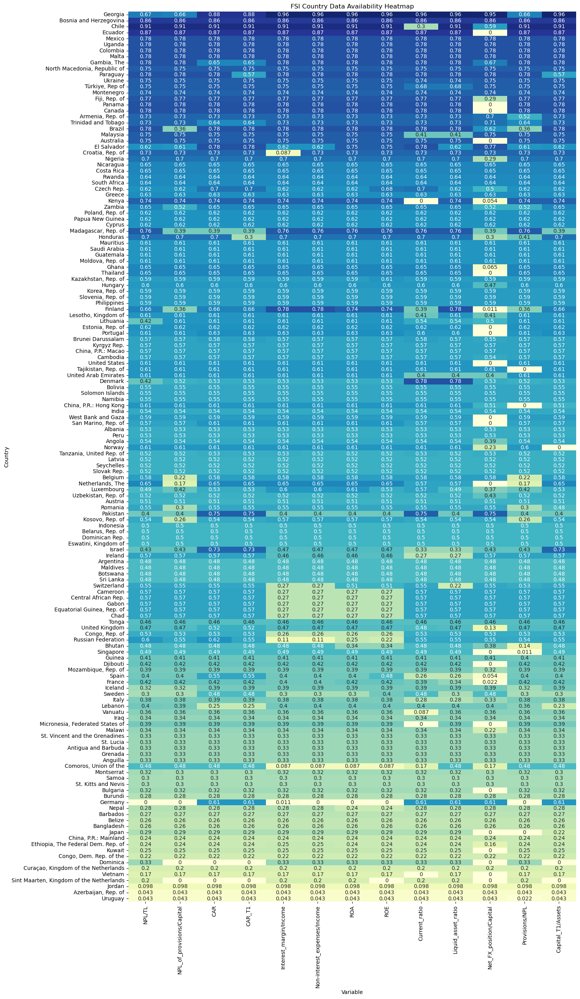

In [151]:
# availability calc (country)
fsi_availability_c = fsi.notna().groupby(fsi['country code']).mean().drop(['country code', 'date'], axis=1)
fsi_availability_c.index = fsi_availability_c.index.map(country_codes)
fsi_availability_c = fsi_availability_c.iloc[fsi_availability_c.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(fsi_availability_c, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('FSI Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

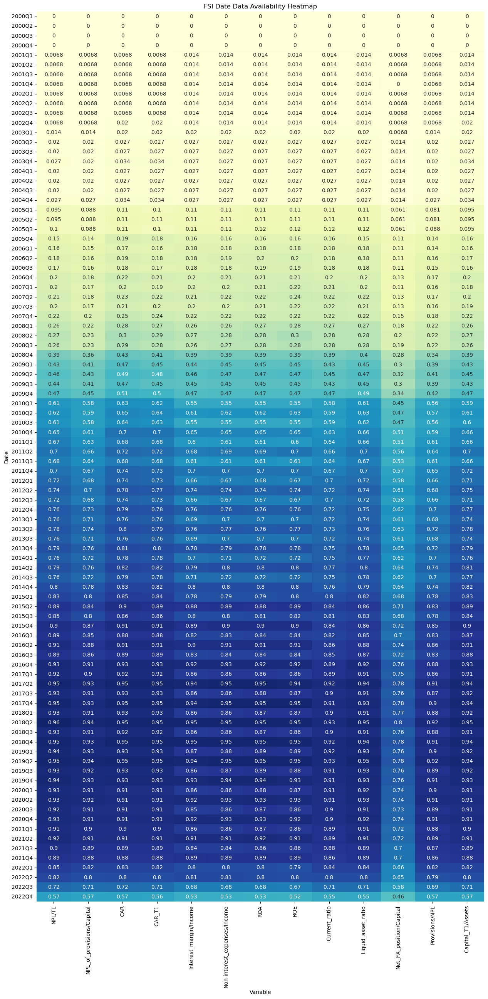

In [150]:
# availability calc (date)
fsi_availability_d = fsi.notna().groupby(fsi['date']).mean().drop(['country code', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(fsi_availability_d, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('FSI Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

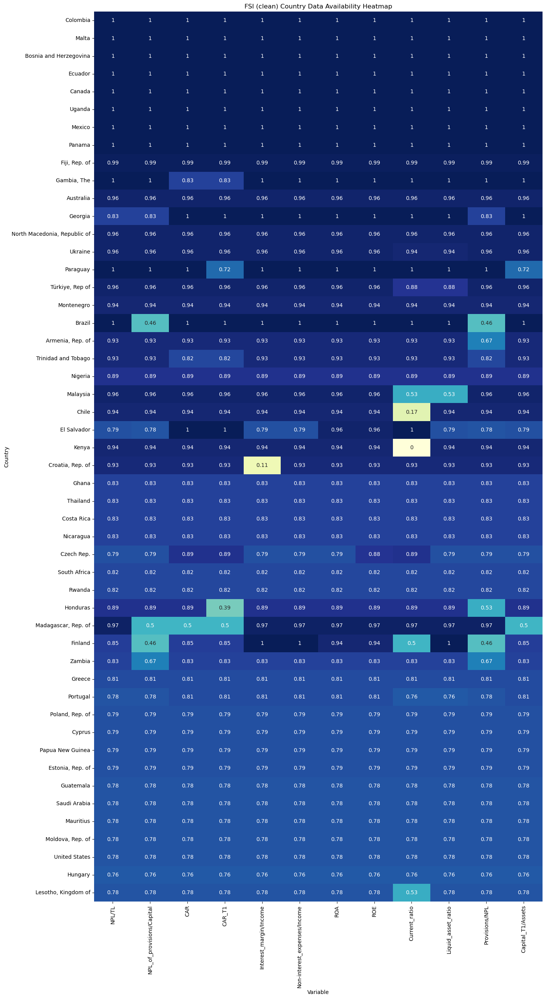

In [148]:
# availability calc (country)
fsi_availability_cc = fsi_clean.notna().groupby(fsi_clean['country code']
                                               ).mean().drop(['country code', 'date'], axis=1)
fsi_availability_cc.index = fsi_availability_cc.index.map(country_codes)
fsi_availability_cc = fsi_availability_cc.iloc[fsi_availability_cc.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(fsi_availability_cc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('FSI (clean) Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

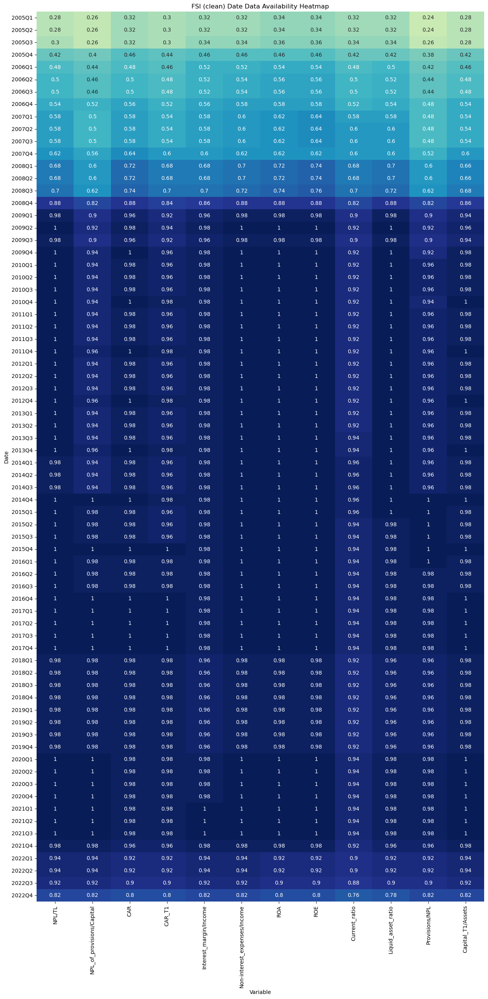

In [149]:
# availability calc (date)
fsi_availability_dc = fsi_clean.notna().groupby(fsi_clean['date']).mean().drop(['country code', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(fsi_availability_dc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('FSI (clean) Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

## IFS cleanup

In [176]:
# observations suggest to 
# 1) drop some columns with many missing values
ifs_drop = ['GDP_nominal_seas_adj', 'GDP_nominal', 
            'GDP_real_seas_adj', 'MPR']
ifs_clean = ifs.drop(ifs_drop, axis=1)

# 2) remove observations before 2005Q1
ifs_clean = ifs_clean[ifs_clean['date'] >= '2005Q1']

# 3) drop countries with many missing values
keep_countries = [
    111, 112, 122, 124, 128, 132, 134, 136, 137, 138, 142, 144, 146,
    156, 158, 163, 172, 174, 176, 178, 181, 182, 184, 186, 193, 196,
    218, 223, 228, 233, 238, 243, 253, 273, 288, 293, 423, 436, 534,
    542, 694, 728, 911, 913, 915, 916, 918, 921, 926, 935, 936, 939,
    941, 944, 946, 960, 962, 963, 964, 968
]
ifs_clean = ifs_clean[ifs_clean['country code'].isin(keep_countries)].reset_index(drop=True)

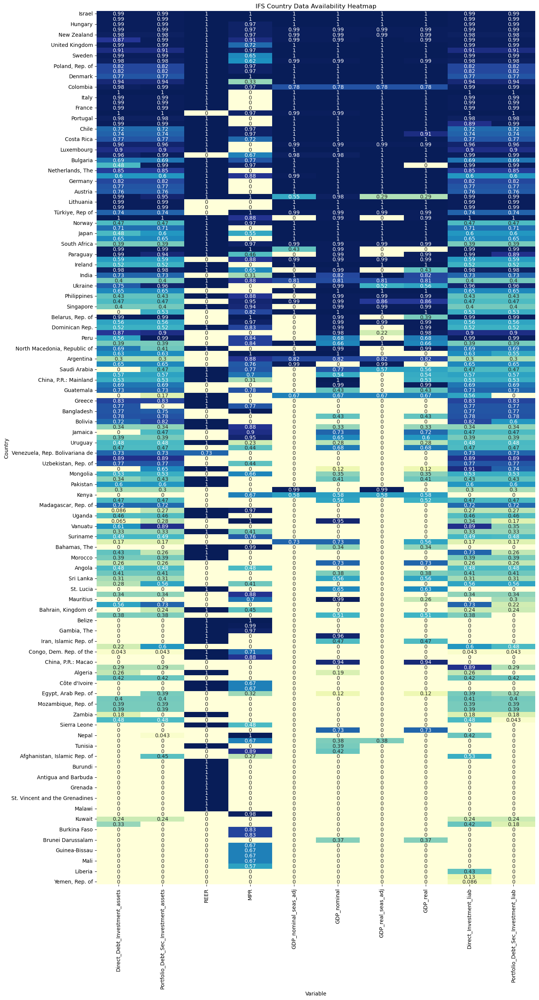

In [177]:
# availability calc (country)
ifs_availability_c = ifs.notna().groupby(ifs['country code']).mean().drop(['country code', 'date'], axis=1)
ifs_availability_c.index = ifs_availability_c.index.map(country_codes)
ifs_availability_c = ifs_availability_c.iloc[ifs_availability_c.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(ifs_availability_c, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('IFS Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

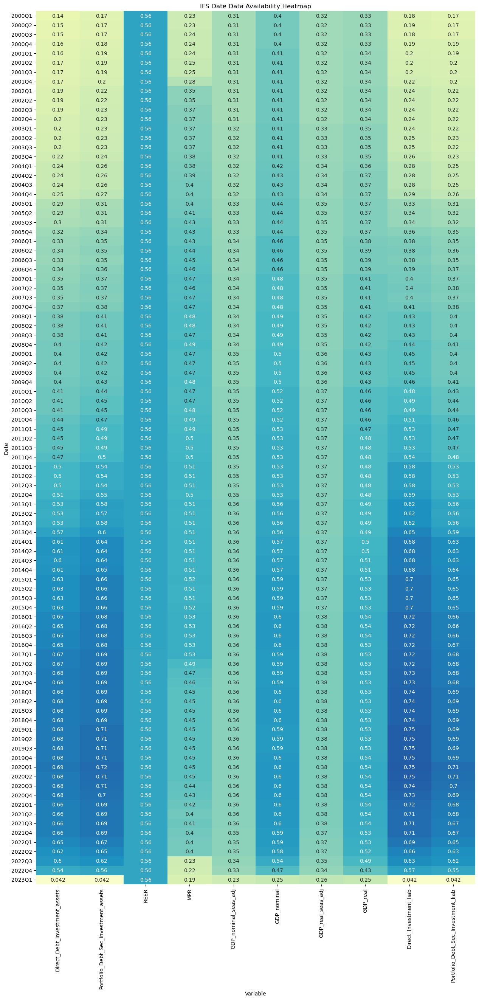

In [159]:
# availability calc (date)
ifs_availability_d = ifs.notna().groupby(ifs['date']).mean().drop(['country code', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(ifs_availability_d, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('IFS Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

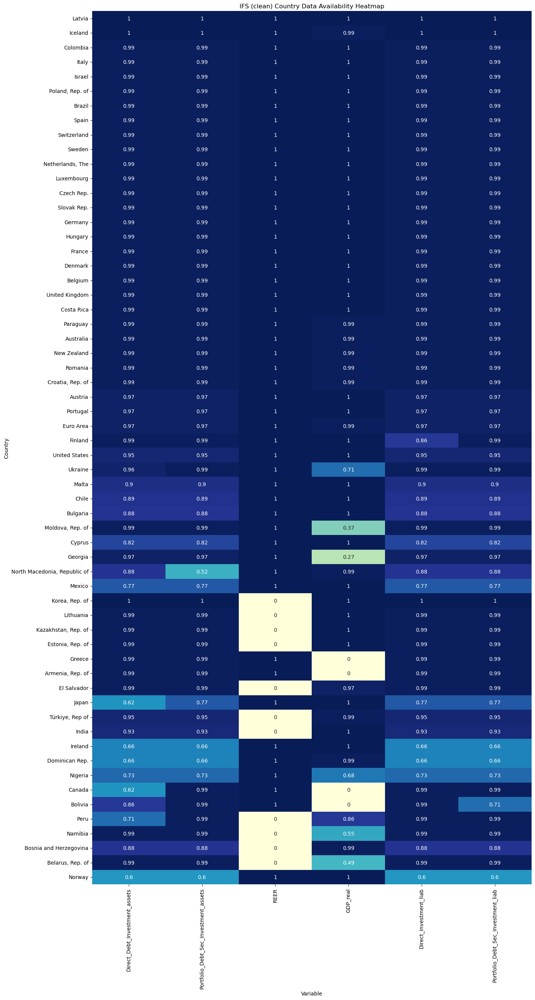

In [178]:
# availability calc (country)
ifs_availability_cc = ifs_clean.notna().groupby(
ifs_clean['country code']).mean().drop(['country code', 'date'], axis=1)
ifs_availability_cc.index = ifs_availability_cc.index.map(country_codes)
ifs_availability_cc = ifs_availability_cc.iloc[ifs_availability_cc.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(ifs_availability_cc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('IFS (clean) Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

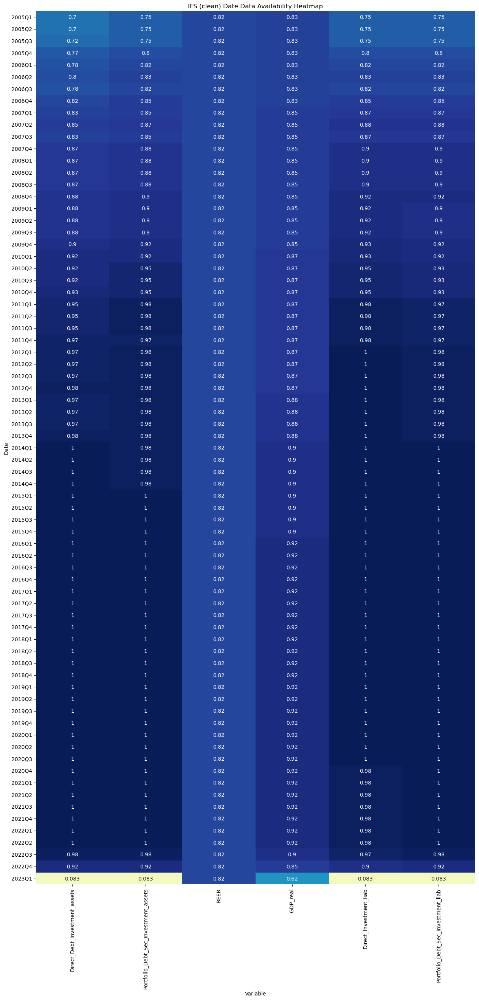

In [179]:
# availability calc (date)
ifs_availability_dc = ifs_clean.notna().groupby(ifs_clean['date']).mean().drop(['country code', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(ifs_availability_dc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('IFS (clean) Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

## Other

In [125]:
# observations suggest to 
# 1) remove: Net_FX_position/Capital
fsi_2_clean = fsi_2.drop([], axis=1)

# # 2) remove observations before 2005Q1
fsi_2_clean = fsi_2_clean[fsi_2_clean['date'] >= '2005Q1'].copy()

# # 3) remove countries with many missing values
# keep_countries = [
#     111, 156, 172, 174, 181, 182, 186, 193, 199, 223, 228, 233, 238,
#     248, 253, 258, 268, 273, 278, 283, 288, 369, 423, 456, 548, 578,
#     648, 652, 664, 666, 674, 684, 694, 714, 746, 754, 819, 853, 911,
#     915, 921, 926, 935, 939, 943, 944, 960, 962, 963, 964
# ]
# fsi_clean = fsi_clean[fsi_clean['country code'].isin(keep_countries)].reset_index(drop=True)

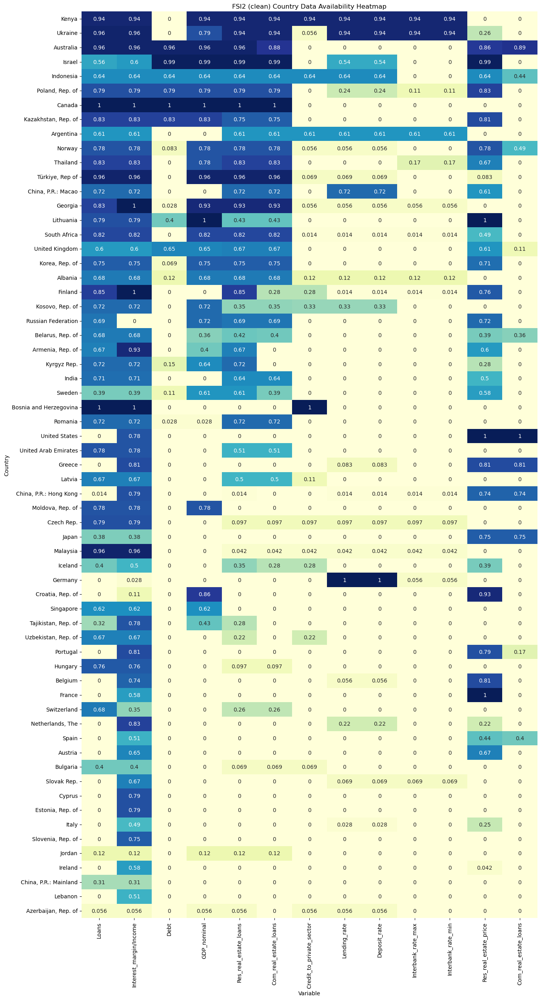

In [126]:
# availability calc (country)
fsi2_availability_cc = fsi_2_clean.notna().groupby(fsi_2_clean['country code']
                                                  ).mean().drop(['country code', 'date'], axis=1)
fsi2_availability_cc.index = fsi2_availability_cc.index.map(country_codes)
fsi2_availability_cc = fsi2_availability_cc.iloc[fsi2_availability_cc.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(fsi2_availability_cc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('FSI2 (clean) Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

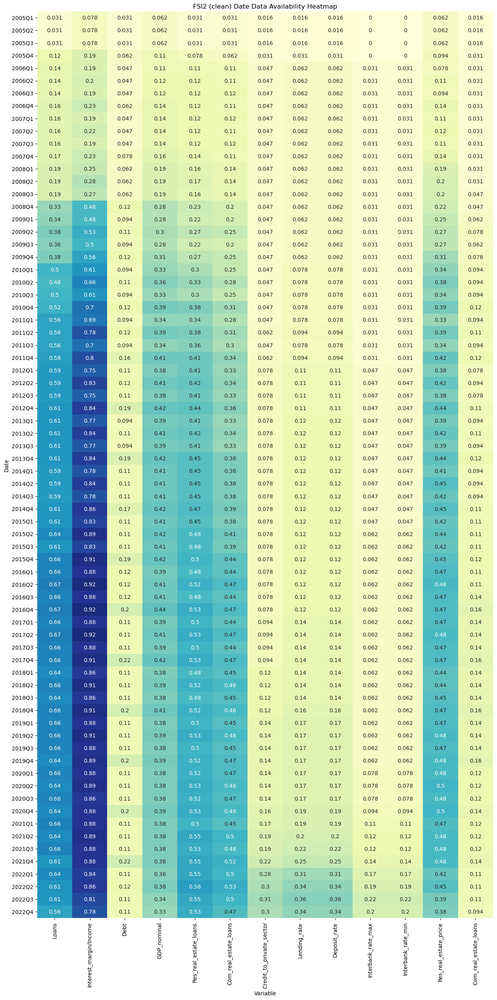

In [127]:
# availability calc (date)
fsi2_availability_dc = fsi_2_clean.notna().groupby(fsi_2_clean['date']).mean().drop(['country code', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(fsi2_availability_dc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('FSI2 (clean) Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

In [128]:
# observations suggest to 
# 1) drop some columns with many missing values
ifs_2_clean = ifs_2.drop([], axis=1)

# 2) remove observations before 2005Q1
ifs_2_clean = ifs_2_clean[ifs_2_clean['date'] >= '2005Q1']

# # 3) drop countries with many missing values
# keep_countries = [
#     111, 112, 122, 124, 128, 132, 134, 136, 137, 138, 142, 144, 146,
#     156, 158, 163, 172, 174, 176, 178, 181, 182, 184, 186, 193, 196,
#     218, 223, 228, 233, 238, 243, 253, 273, 288, 293, 423, 436, 534,
#     542, 694, 728, 911, 913, 915, 916, 918, 921, 926, 935, 936, 939,
#     941, 944, 946, 960, 962, 963, 964, 968
# ]
# ifs_clean = ifs_clean[ifs_clean['country code'].isin(keep_countries)].reset_index(drop=True)

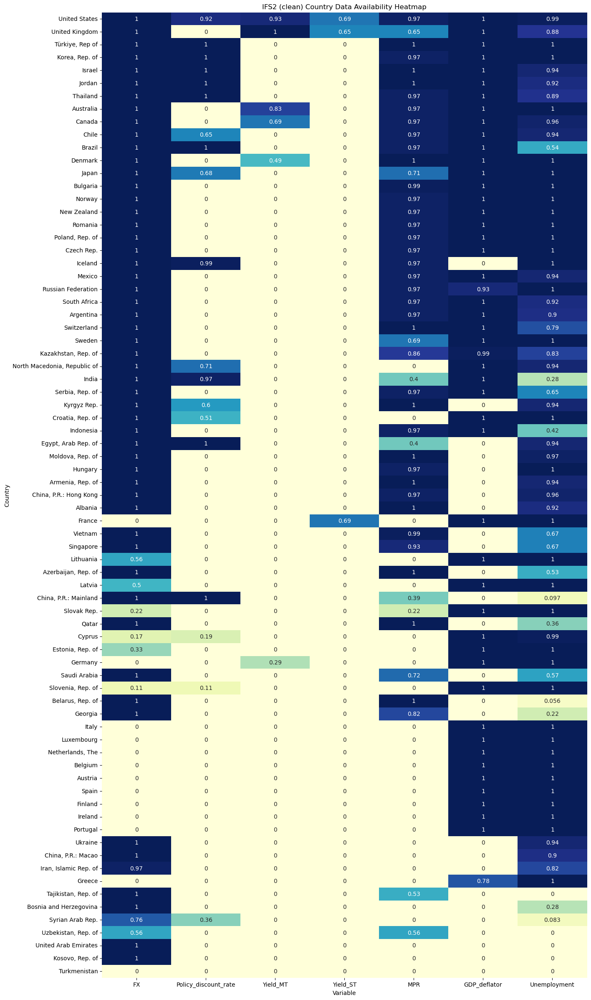

In [129]:
# availability calc (country)
ifs2_availability_cc = ifs_2_clean.notna().groupby(
ifs_2_clean['country code']).mean().drop(['country code', 'date'], axis=1)
ifs2_availability_cc.index = ifs2_availability_cc.index.map(country_codes)
ifs2_availability_cc = ifs2_availability_cc.iloc[ifs2_availability_cc.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(ifs2_availability_cc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('IFS2 (clean) Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

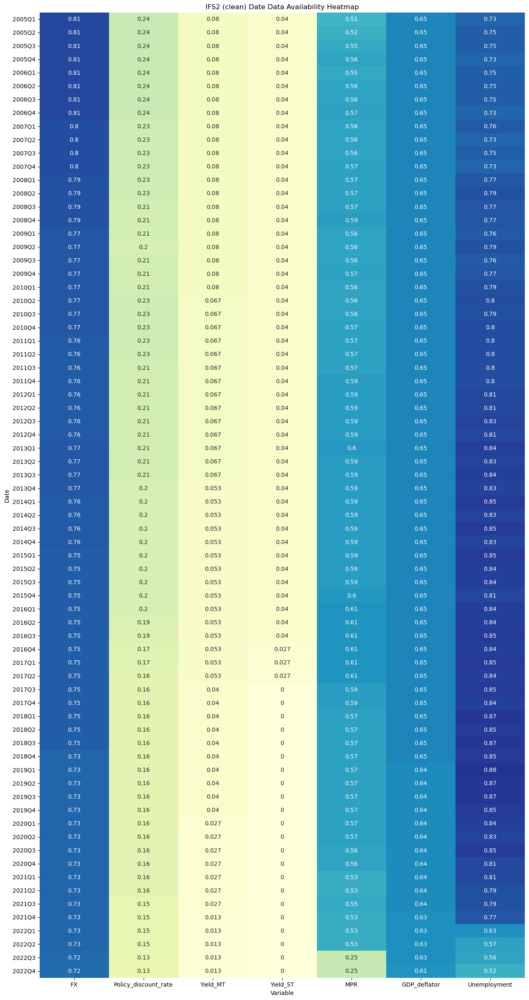

In [130]:
# availability calc (date)
ifs2_availability_dc = ifs_2_clean.notna().groupby(ifs_2_clean['date']).mean().drop(['country code', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(15, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(ifs2_availability_dc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('IFS2 (clean) Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

# Dataset construction and cleanup

## Pre-cleaning method

In [190]:
datasets = [ifs_clean, fsi_clean, mapp]
for i, dataset in enumerate(datasets):
    if i == 0:
        data = dataset
    else:
        data = pd.merge(data, dataset, how='outer', on=['date', 'country code'])       

data['country'] = data['country code'].replace(country_codes)
data = data.drop(columns='country code')
data = data[[data.columns[-1]] + list(data.columns[:-1])].copy()

In [222]:
# observations suggest to 
# 1) keep observations between 2005Q1 and 2021Q4
data_clean = data.copy()
date_range = (data_clean['date'] >= '2005Q1') & (data_clean['date'] <= '2021Q4')
data_clean = data_clean[date_range].copy()

# 2) remove countries with many missing values
keep_countries = [
    'Colombia', 'Malta', 'Australia', 'Paraguay', 'Ukraine', 'Mexico',
    'Brazil', 'Georgia', 'Chile', 'North Macedonia, Republic of',
    'Canada', 'Armenia, Rep. of', 'Bosnia and Herzegovina',
    'Croatia, Rep. of', 'Türkiye, Rep of', 'Costa Rica', 'Czech Rep.',
    'Portugal', 'Finland', 'Poland, Rep. of', 'El Salvador', 'Nigeria',
    'Hungary', 'United States', 'Cyprus', 'Moldova, Rep. of', 'Greece',
    'Estonia, Rep. of'
]
data_clean = data_clean[data_clean['country'].isin(keep_countries)].reset_index(drop=True)

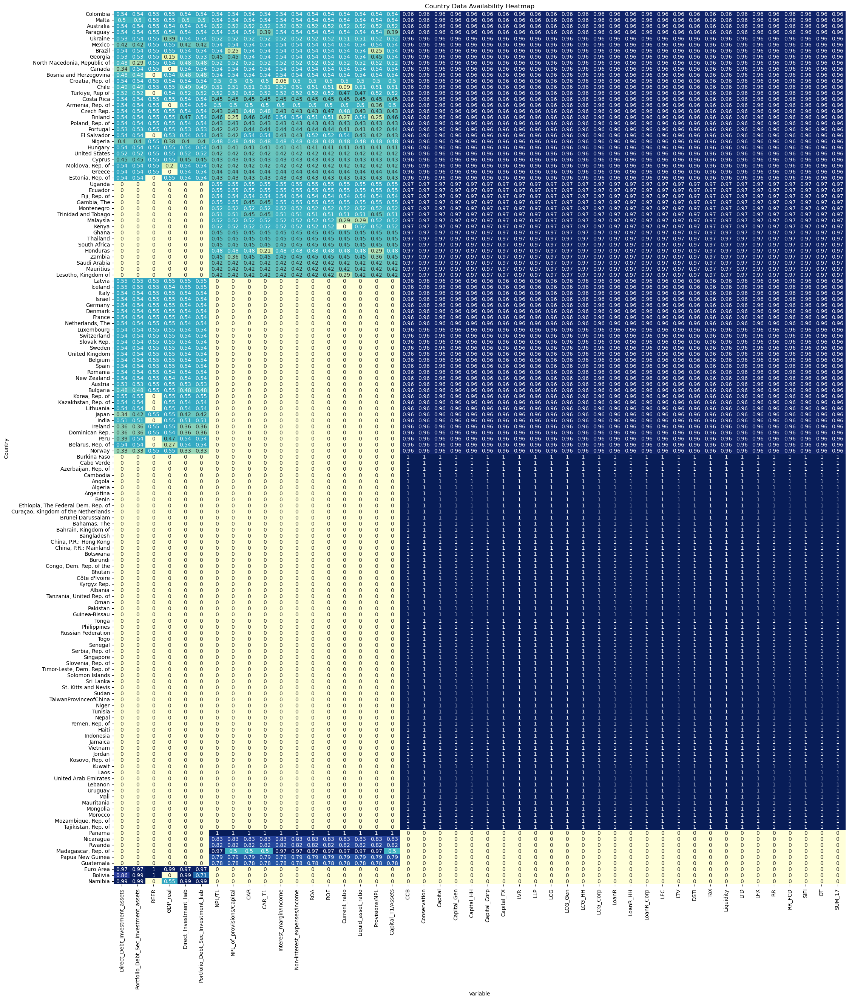

In [200]:
# availability calc (country)
data_availability_c = data.notna().groupby(data['country']).mean().drop(['country', 'date'], axis=1)
data_availability_c = data_availability_c.iloc[data_availability_c.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(25, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(data_availability_c, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('Country Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

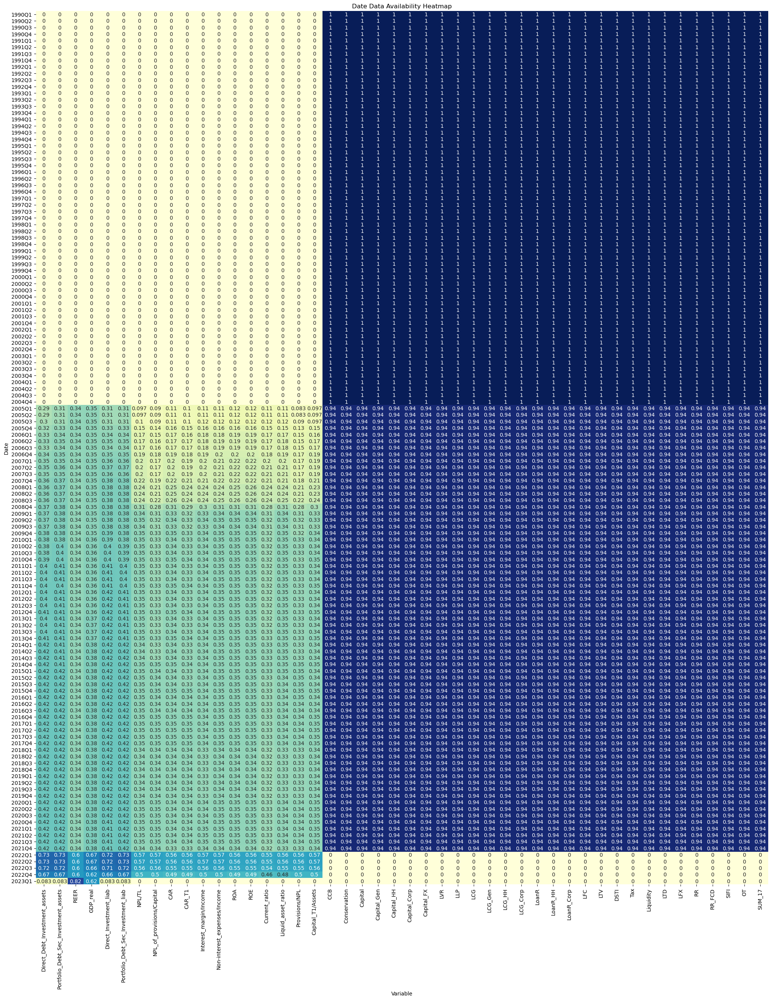

In [205]:
# availability calc (date)
data_availability_d = data.notna().groupby(data['date']).mean().drop(['country', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(25, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(data_availability_d, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('Date Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

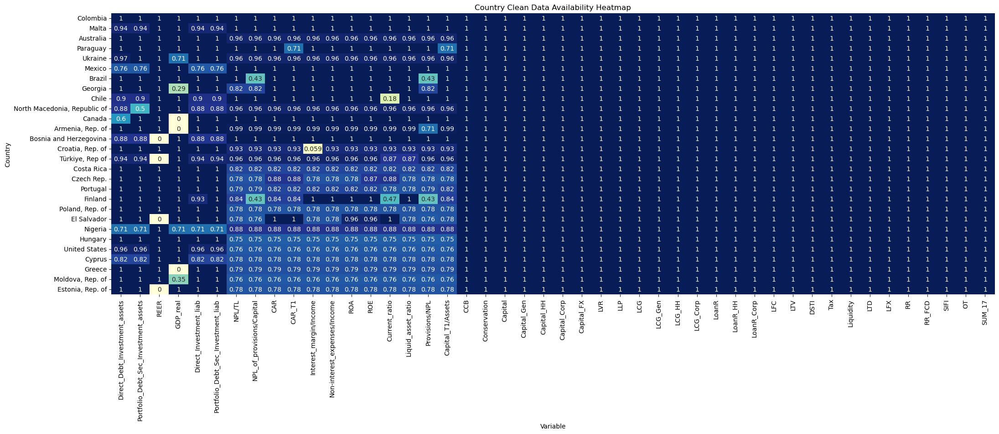

In [230]:
# availability calc (country)
data_availability_cc = data_clean.notna().groupby(data_clean['country']).mean().drop(['country', 'date'], axis=1)
data_availability_cc = data_availability_cc.iloc[data_availability_cc.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(25, 8))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(data_availability_cc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('Country Clean Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

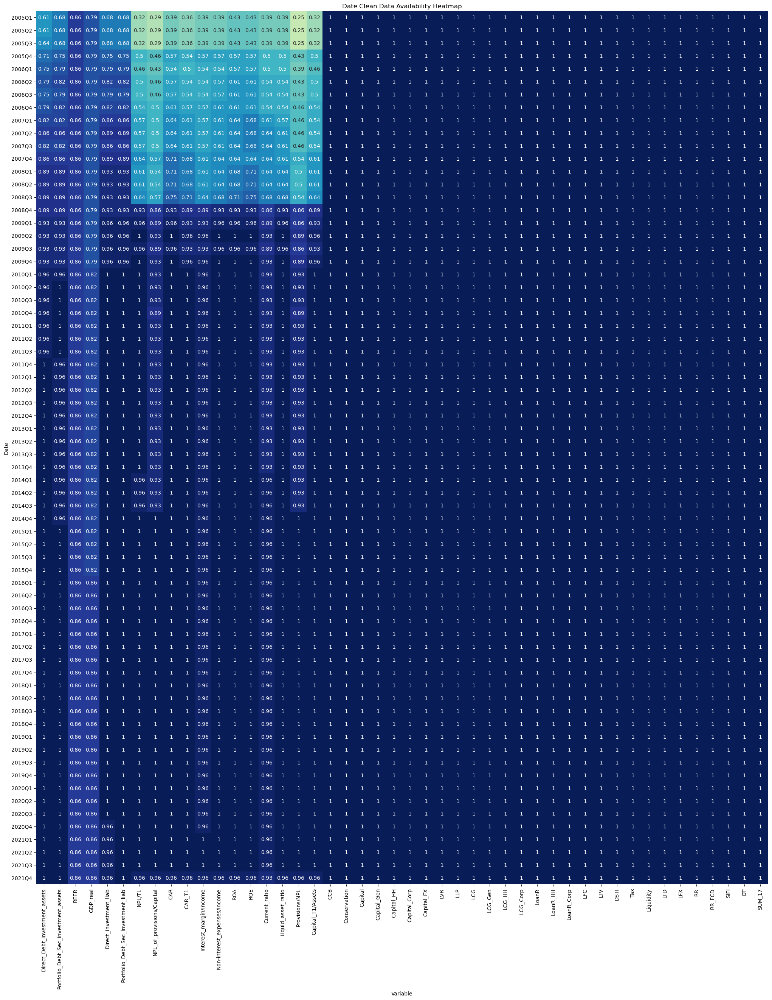

In [231]:
# availability calc (date)
data_availability_dd = data_clean.notna().groupby(data_clean['date']).mean().drop(['country', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(25, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(data_availability_dd, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('Date Clean Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()

## Raw-cleaning method

In [232]:
datasetsRaw = [ifs, fsi, mapp]
for i, dataset in enumerate(datasetsRaw):
    if i == 0:
        dataRaw = dataset
    else:
        dataRaw = pd.merge(dataRaw, dataset, how='outer', on=['date', 'country code'])       

dataRaw['country'] = dataRaw['country code'].replace(country_codes)
dataRaw = dataRaw.drop(columns='country code')
dataRaw = dataRaw[[dataRaw.columns[-1]] + list(dataRaw.columns[:-1])].copy()

In [248]:
# observations suggest to:
# 1) drop columns with many missing values
dataRaw_drop = ['Net_FX_position/Capital','GDP_nominal_seas_adj', 
                'GDP_nominal', 'GDP_real_seas_adj', 'MPR']
dataRaw_clean = dataRaw.drop(dataRaw_drop, axis=1)

# 2) keep observations between 2005Q1 and 2021Q4
dateRaw_range = (dataRaw_clean['date'] >= '2005Q1') & (dataRaw_clean['date'] <= '2021Q4')
dataRaw_clean = dataRaw_clean[dateRaw_range].copy()

# 3) remove countries with many missing values
keep_countries = [
    'Colombia', 'Malta', 'Australia', 'Paraguay', 'Ukraine', 'Mexico',
    'Brazil', 'Chile', 'Georgia', 'North Macedonia, Republic of', 'Canada',
    'Armenia, Rep. of', 'Bosnia and Herzegovina', 'Croatia, Rep. of',
    'Türkiye, Rep of', 'Fiji, Rep. of', 'Costa Rica', 'Czech Rep.',
    'Portugal', 'Finland', 'Poland, Rep. of', 'Uganda', 'El Salvador',
    'Nigeria', 'Hungary', 'United States', 'Cyprus', 'Kazakhstan, Rep. of',
    'Greece', 'Moldova, Rep. of', 'Denmark', 'Estonia, Rep. of',
    'Netherlands, The', 'Austria', 'Korea, Rep. of', 'Lithuania',
    'Luxembourg', 'South Africa', 'Latvia', 'Slovak Rep.'
]
dataRaw_clean = dataRaw_clean[dataRaw_clean['country'].isin(keep_countries)].reset_index(drop=True)

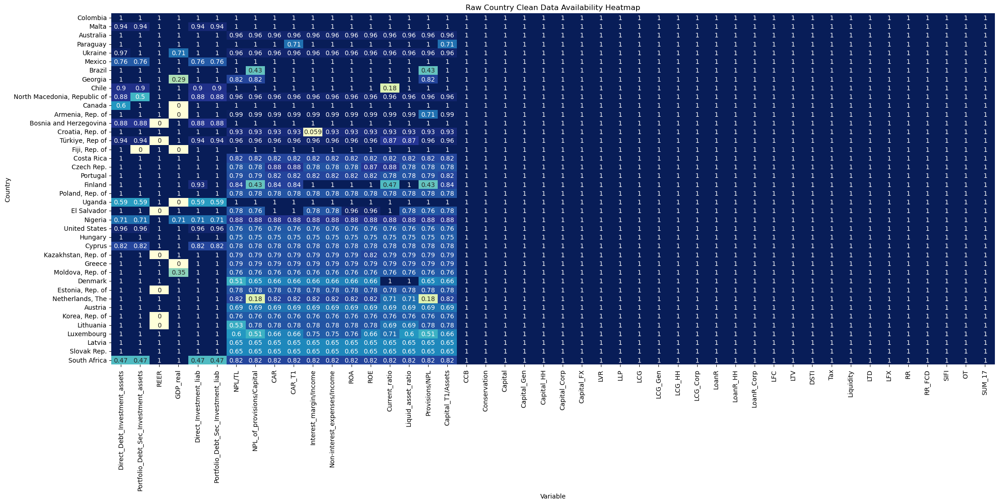

In [251]:
# availability calc (country)
dataRaw_availability_rcc = dataRaw_clean.notna().groupby(
dataRaw_clean['country']).mean().drop(['country', 'date'], axis=1)
dataRaw_availability_rcc = dataRaw_availability_rcc.iloc[dataRaw_availability_rcc.mean(axis=1).argsort()[::-1]]

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(25, 10))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(dataRaw_availability_rcc, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('Raw Country Clean Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Country')

# Display the plot
plt.show()

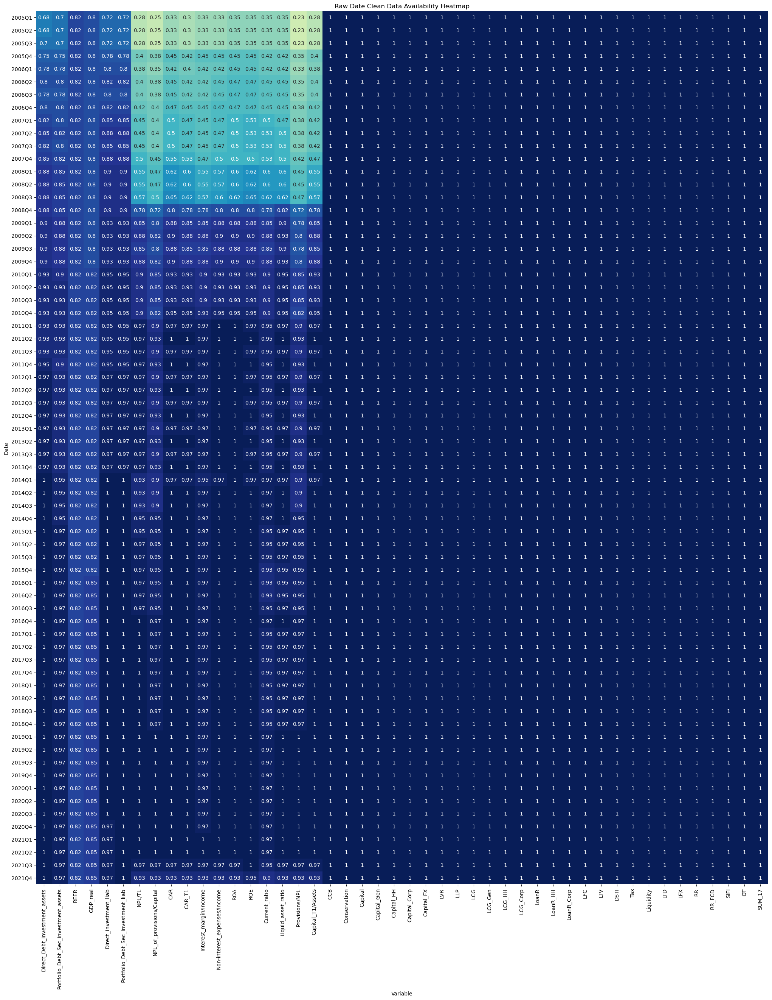

In [252]:
# availability calc (date)
dataRaw_availability_rdd = dataRaw_clean.notna().groupby(
dataRaw_clean['date']).mean().drop(['country', 'date'], axis=1)

# Set up the figure and plot the availability heatmap
fig, ax = plt.subplots(figsize=(25, 30))  # Adjust the figsize as needed to ensure visibility
sns.heatmap(dataRaw_availability_rdd, cmap='YlGnBu', ax=ax, vmin=0, vmax=1, cbar=False, annot=True)

# Customize the plot
ax.set_title('Raw Date Clean Data Availability Heatmap')
ax.set_xlabel('Variable')
ax.set_ylabel('Date')

# Display the plot
plt.show()